
### Radial Velocity computation, with pre-calibrated files

Cleaned version with main functions moved into radial_velocity_functions.py

In this file I will work with the precalibrated spectra data from EXPRES given to me by Lily Zhao.


### Imports

In [32]:
# Import calibration functions
# Run this to reimport without having to restart the whole notebook
import radial_velocity_functions
import importlib
importlib.reload(radial_velocity_functions)
from radial_velocity_functions import *

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import tqdm as tqdm
from tqdm import tqdm
import pandas as pd

# plt styles
matplotlib.rcParams["text.usetex"] = True
matplotlib.rcParams["font.family"] = "serif"
matplotlib.rcParams["font.size"] = 10 
matplotlib.rcParams['figure.dpi'] = 250

from os import walk

## Feature and match finding

### First look at data

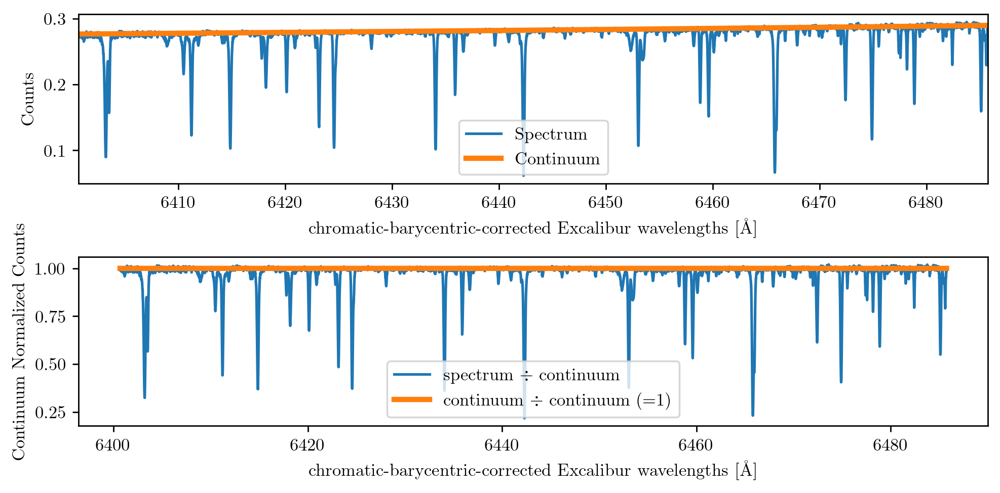

In [16]:
filenames = get_all_spectra_filenames()
SPECTRA_DATA = load_spectra_fits(filenames[0])

fig, (ax1, ax2) = plt.subplots(nrows = 2, figsize=(8,4))

order = 65

y, y_err, x = get_spec_wavel(SPECTRA_DATA, order, continuum_normalized=False)
ax1.plot(x, y, label="Spectrum")

# Plot continuum
excalibur_mask  = SPECTRA_DATA['EXCALIBUR_MASK'][order]
cont = SPECTRA_DATA['continuum'][order][excalibur_mask]
ax1.plot(x, cont, linewidth=3, label="Continuum")
ax1.set_xlim(min(x), max(x))

y, y_err, x = get_spec_wavel(SPECTRA_DATA, order, continuum_normalized=True)
ax2.plot(x, y, label=r"spectrum $\div$ continuum")
ax2.plot(x, cont/cont, linewidth=3, label=r"continuum $\div$ continuum (=1)")


ax1.set_xlabel("chromatic-barycentric-corrected Excalibur wavelengths [Å]")
ax1.set_ylabel("Counts")
ax1.legend(loc = "lower center")

ax2.set_xlabel("chromatic-barycentric-corrected Excalibur wavelengths [Å]")
ax2.set_ylabel("Continuum Normalized Counts")
ax2.legend(loc = "lower center")

fig.tight_layout()

#### Plot as matrix

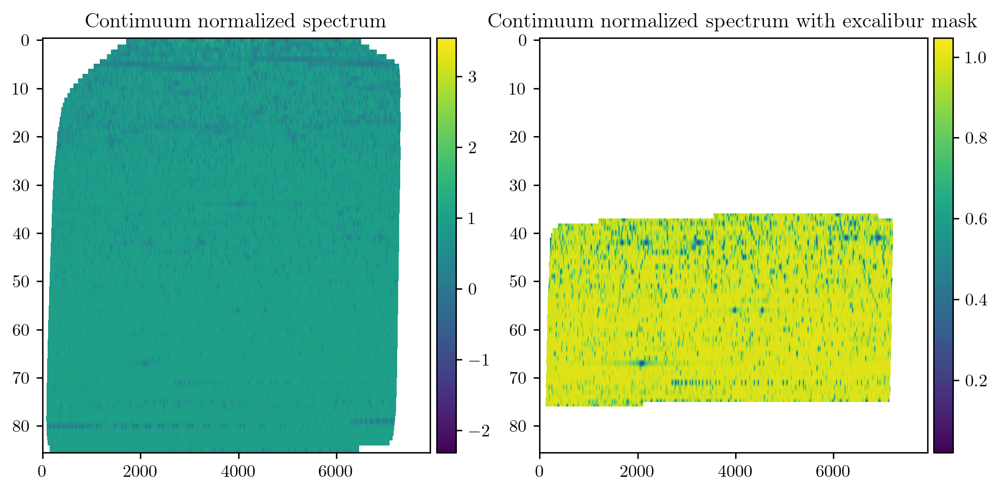

In [17]:
filenames = get_all_spectra_filenames(SPECTRA_PATH_34411)
SPECTRA_DATA = load_spectra_fits(filenames[0])

orders_pix = np.array([ SPECTRA_DATA['spectrum'][o]/SPECTRA_DATA['continuum'][o] for o in np.arange(len(SPECTRA_DATA['spectrum']))]) # create 2d array

# Plot
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize=(8, 4))
cs = ax1.imshow(orders_pix, aspect="auto")
cax = make_axes_locatable(ax1).append_axes('right', size='5%', pad=0.05) # to make color bar same height at plot, needed when making several subplots with each colorbar
cbar = fig.colorbar(cs, ax=ax1, cax=cax)
ax1.set_title("Contimuum normalized spectrum")

# Plot masked filter
excalibur_mask  = SPECTRA_DATA['EXCALIBUR_MASK']
orders_pix[excalibur_mask == False] = np.nan
cs = ax2.imshow(orders_pix, aspect="auto")
cax = make_axes_locatable(ax2).append_axes('right', size='5%', pad=0.05) # to make color bar same height at plot, needed when making several subplots with each colorbar
cbar = fig.colorbar(cs, ax=ax2, cax=cax)
ax2.set_title("Contimuum normalized spectrum with excalibur mask")

fig.tight_layout()


### Find features

#### Plot features in orders

1267 peaks found
1255 peaks found


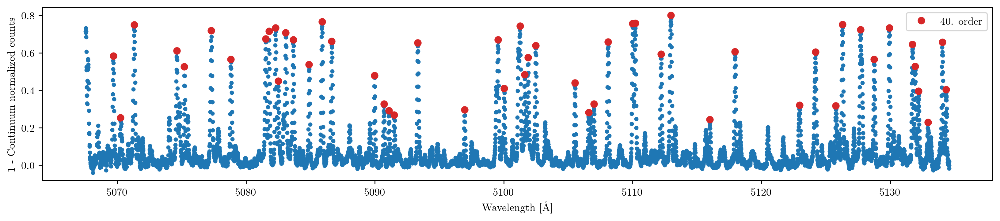

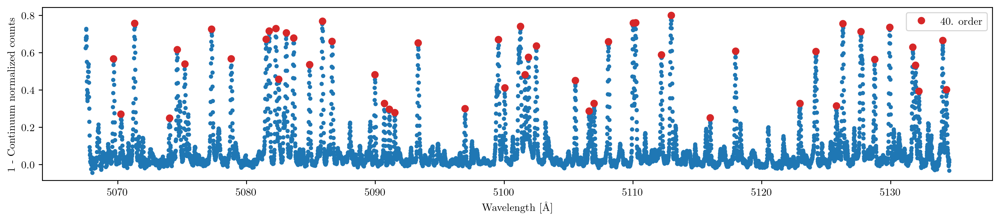

In [21]:
# Plot all orders in one file
filenames = get_spectra_filenames_without_duplicate_dates(SPECTRA_PATH_34411)[:10]
d1 = find_features(
    filenames[0], 
    plot_orders=[40], 
)
d1 = find_features(
    filenames[1], 
    plot_orders=[40], 
)

#### Matching features

1241 peaks found
1210 peaks found
753 matches found : dist rejected 33, area rejected 451


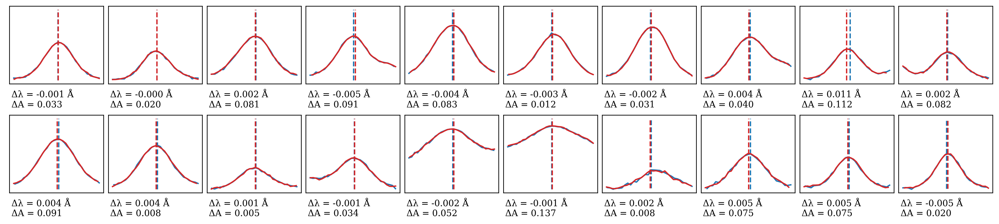

In [26]:
filenames = get_spectra_filenames_without_duplicate_dates(SPECTRA_PATH_34411)
file1, file2 = filenames[5], filenames[15]
matches = find_feature_matches2(find_features(file1), find_features(file2))
plot_matches(matches[:20])

### Compute RV shift through cross-correlation for all features between two observations

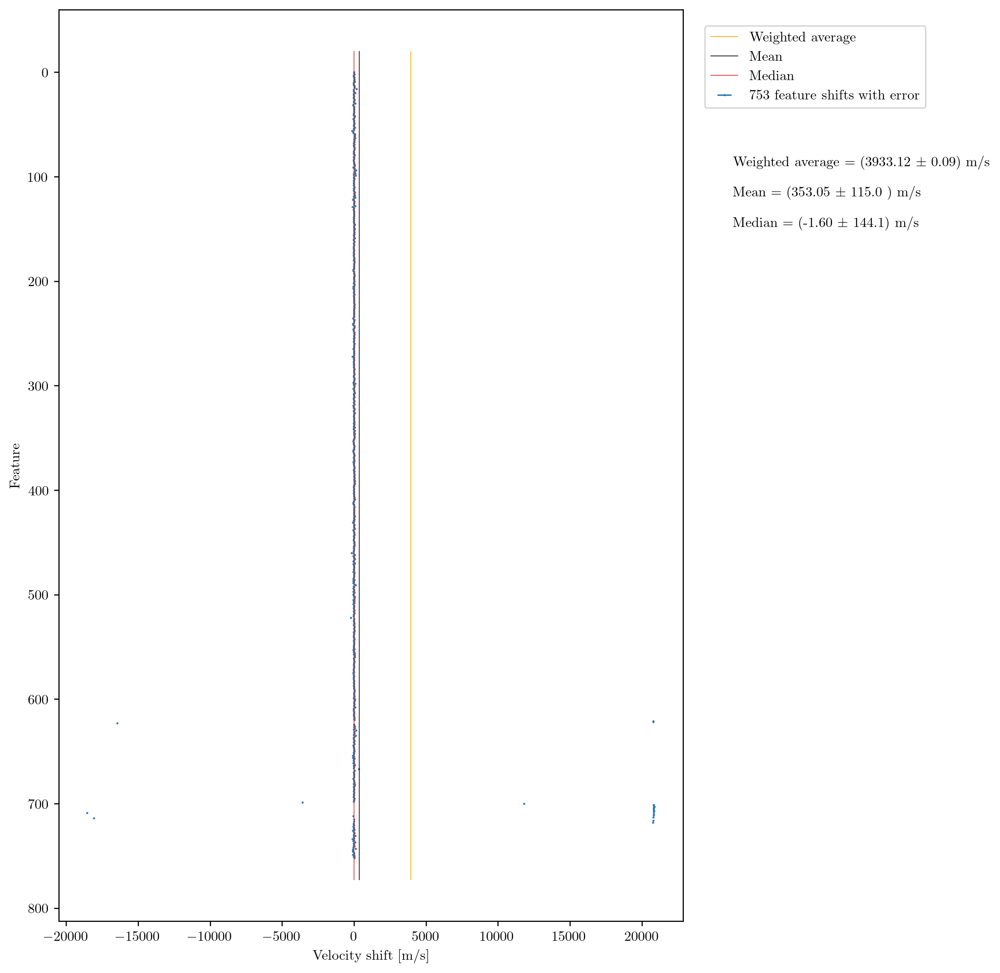

In [34]:
shifts = compute_all_feature_shifts(matches)
plot_features_shift(shifts)

### Compute all cross-correlations in parallel 

In [35]:
# ------ Params ------------------------------

N_processes = 6             
path=SPECTRA_PATH_34411
date_duplicates=True        # false to only use one observation from each day.
use_bary=True               # true to use barycentric-corrected data
max_dist=0.5                # max shift allowed in angstrom
max_area_diff = 0.2         # max difference in the sum of feature data points between observations (filters out unlike peaks based on shape)
error_scale_factor=1        # scale up original errors
save_extra = True           # True to save chi2 as well
save_as = "34411_all_baryTrue_err1_dist1_area02_chi2"
save_in = "lily_data_results"

# ------------------------------------------

if date_duplicates:
    filenames = get_all_spectra_filenames(path)
else:
    filenames = get_spectra_filenames_without_duplicate_dates(path)

# Find features in all files 
print("Finding features for all files...")
features = find_all_features(filenames, error_scale_factor, use_bary)

# Setup coords :: Compute one list of coords
coords = compute_coords(filenames)
        
# Define function for each process
def compute(coords):
    x, y = coords[0], coords[1]
    matches = find_feature_matches2(features[x], features[y], log=False, max_dist=max_dist, max_area_diff=max_area_diff)
    shifts = compute_all_feature_shifts(matches, log=False, return_extra=save_extra)
    return shifts

if __name__ == '__main__':
    import multiprocess
    pool = multiprocess.Pool(processes = N_processes)
    
    result = []
    print("Computing shifts for all files combinations...")
    for r in tqdm(pool.imap_unordered(compute, coords), total=len(coords)):
        result.append(r)
        
    # np.save("lily_data_results/" + save_as, [result, coords])
    np.save(save_in + "/" + save_as, [result, coords])
    print("Finished!")

#### Loading results

In [38]:
def load_reduce_and_plot_results(file, with_date_duplicates=False):
    result, coords = np.load(file, allow_pickle=True)
    plot_matrix(*parse_matrix_results(result, coords), plot_ratio=True, kms=False)
    m, final_shifts, final_shifts_err, days = matrix_reduce_results_file(file, SPECTRA_PATH_34411, plot=True, with_date_duplicates=with_date_duplicates)

188 187


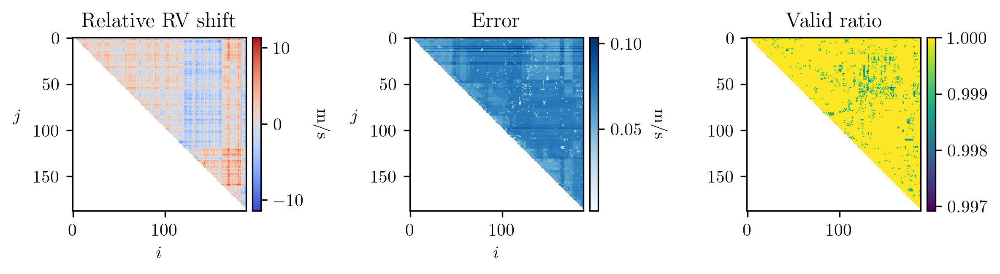

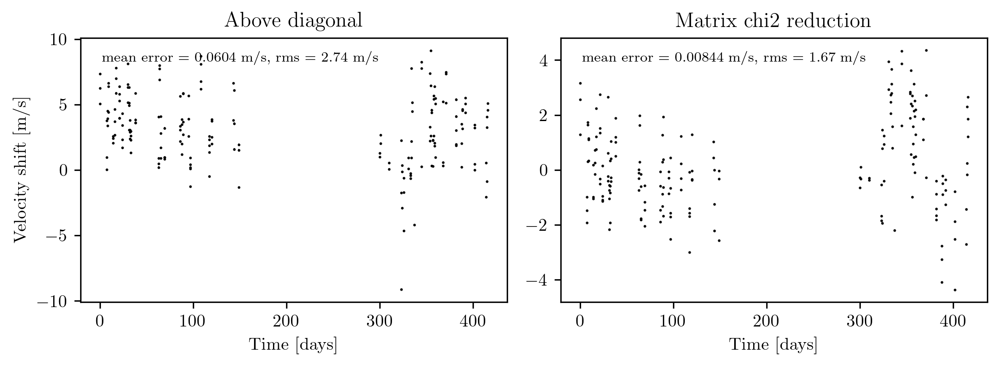

In [17]:
load_reduce_and_plot_results("lily_data_results/34411_all_baryTrue_err1_dist05_area02.npy", with_date_duplicates=True)

188 187


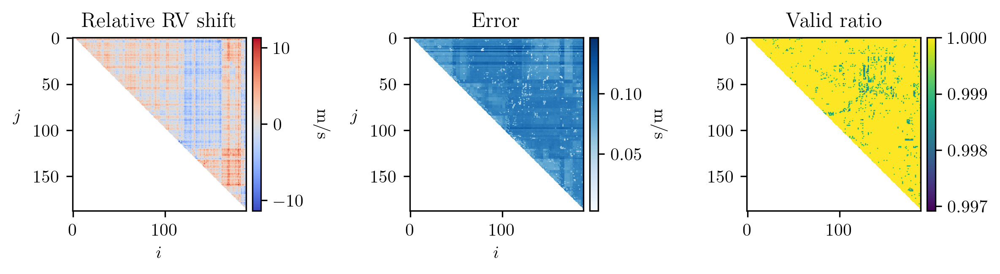

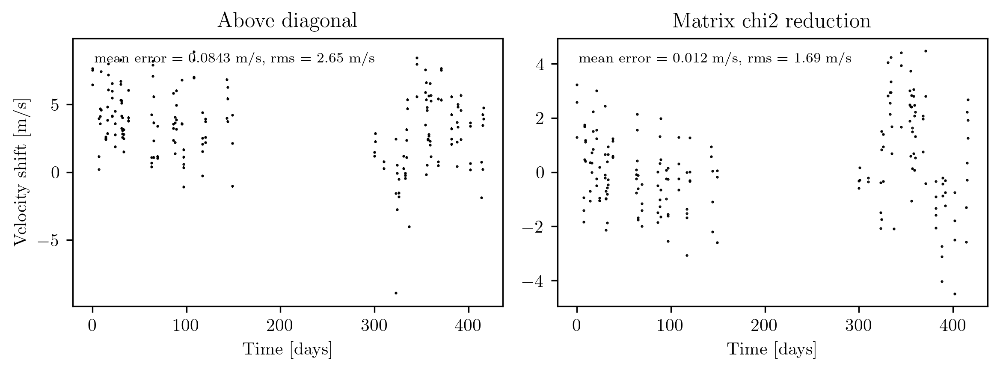

In [16]:
load_reduce_and_plot_results("lily_data_results/34411_all_baryTrue_err2_dist05_area02.npy", with_date_duplicates=True)

### Plot all feature plots as matrix

In [36]:
result, coords = np.load("lily_data_results/34411_58_baryTrue_err1_dist05_area02.npy", allow_pickle=True)
plot_features_shift_matrix(result, coords)